# 

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression


#

In [2]:
# scores
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [3]:
#helpers
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

In [4]:
#models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [5]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,classification_report, confusion_matrix, mean_squared_error, r2_score

In [6]:
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)

In [7]:
# functions

In [8]:
def drop_columns(df, columns):
    df.drop(columns, axis=1, inplace=True, errors='ignore')


def drop_duplicates(df):
    df_train.drop_duplicates(inplace=True)


def mark_minus_invalids_as_nan(df, columns):
    for col in columns:
        # df[df[col]<0][col]=np.nan
        df.loc[df[col] < 0, col] = np.nan


def set_nan(df, bounds):
    data = df.copy()
    for key in bounds.keys():
        # print("values",bounds[key])
        data.loc[data[key] < bounds[key][0], key] = np.nan
        data.loc[data[key] > bounds[key][1], key] = np.nan
    return data


def isNaN(num):
    if float('-inf') < float(num) < float('inf'):
        return False
    else:
        return True


def categorical_features_imputation_by_mode(df, features):
    for f in features:
        mode = df_train[~df_train[f].isnull()][f].value_counts().idxmax()
        # print(mode)
        df[f] = df[f].fillna(mode)
    return df


def regression_imputation(df, sets):
    for s in sets:
        # print(s)
        df.loc[df[s[0]].isnull() & df[s[1]].isnull(), s[0]] = df[s[0]].median()
        df.loc[df[s[0]].isnull() & df[s[1]].isnull(), s[1]] = df[s[1]].median()

        # print(df_test.iloc[[357]])
        # return
        lr_0 = LinearRegression()
        lr_1 = LinearRegression()
        valid = df.dropna(subset=s)
        # train_set_0 =df.dropna(subset=[s[0]])[s]
        # train_set_1 =df.dropna(subset=[s[1]])[s]
        # return valid

        a = valid[[s[0]]]
        b = valid[[s[1]]]
        # print(a)
        lr_0.fit(a, b)
        lr_1.fit(b, a)
        #
        #
        #
        for i in df.index:
            if isNaN(df[s[0]][i]):
                v = np.array([[df[s[1]][i]]])
                # print(i,df[s[0]][i],v)
                # return
                df[s[0]][i] = lr_1.predict(v)[0][0]

            elif isNaN(df[s[1]][i]):
                v = np.array([[df[s[0]][i]]])

                df[s[1]][i] = lr_0.predict(v)[0][0]

    return df
    # df.loc[df[s[1]].isnull(),s[1]] = lr_0.predict(df[[s[0]]])[df[s[1]].isnull()]
    # df.loc[df[s[0]].isnull(),s[0]] = lr_1.predict(df[[s[1]]])[df[s[0]].isnull()]


def handle_missing_by_median(df, features):
    data = df.copy()
    for feature in features:
        data.loc[data[feature].isnull(), feature] = df[feature].median()
    return data

# Getting Dataset

In [9]:
df_train = pd.read_csv('Train_Dataset_190184A.csv')
df_test= pd.read_csv('Test_Dataset_190184A.csv')

In [10]:
df_train.head()

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn
0,1001,15.0,452,no,no,0.0,121.1,130.0,20.59,216.0,86.0,18.36,235.1,33.0,10.58,16.1,5.0,4.35,2.0,No
1,1002,105.0,452,no,no,0.0,259.3,96.0,44.08,175.2,97.0,14.89,222.4,36.0,10.01,12.0,5.0,3.24,3.0,No
2,1003,97.0,452,no,yes,32.0,183.4,94.0,31.18,269.1,120.0,22.87,203.5,38.0,9.16,6.7,4.0,1.81,5.0,No
3,1004,121.0,445,no,yes,35.0,68.7,95.0,11.68,209.2,69.0,17.78,197.4,42.0,8.88,11.4,4.0,3.08,1.0,No
4,1005,98.0,452,no,yes,22.0,278.3,89.0,47.31,93.4,143.0,7.94,107.6,42.0,4.84,9.7,5.0,2.62,0.0,No


# Keep Baseline set

In [11]:
df_baseline_train = df_train.copy()
df_baseline_test = df_test.copy()

# Data Preprocessing

In [12]:
df_train.shape,df_test.shape

((2108, 20), (1454, 19))

In [13]:
drop_features = ['customer_id', 'Unnamed: 19', 'Unnamed: 20']
drop_columns(df_train, drop_features)
drop_columns(df_test, drop_features)

In [14]:
df_train.shape,df_test.shape

((2108, 19), (1454, 18))

#### remove duplicates

In [15]:
df_train.duplicated().sum(),df_test.duplicated().sum()

(0, 0)

In [16]:
drop_duplicates(df_train)
drop_duplicates(df_test)

In [17]:
df_train.duplicated().sum(),df_test.duplicated().sum()

(0, 0)

### Data types identify

#### View Categorical

In [18]:
train_categorical = ['intertiol_plan', 'voice_mail_plan']
test_categorical = ['intertiol_plan', 'voice_mail_plan', 'location_code']
numerical = ['account_length',
             'number_vm_messages',
             'total_day_min',
             'total_day_calls',
             'total_day_charge',
             'total_eve_min',
             'total_eve_calls',
             'total_eve_charge',
             'total_night_minutes',
             'total_night_calls',
             'total_night_charge',
             'total_intl_minutes',
             'total_intl_calls',
             'total_intl_charge',
             'customer_service_calls']

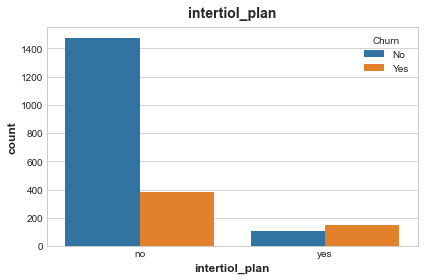

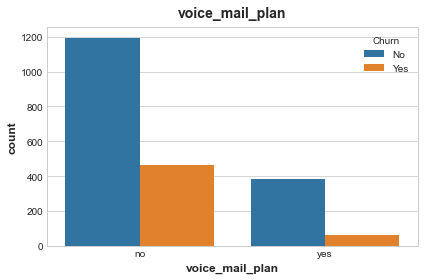

In [19]:
for f in train_categorical:
    ax = sns.countplot(x = df_train[f], data = df_train, hue='Churn')
    plt.title(f)
    plt.show()


#### View Numerical

C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: Fu

C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: Fu

C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: Fu

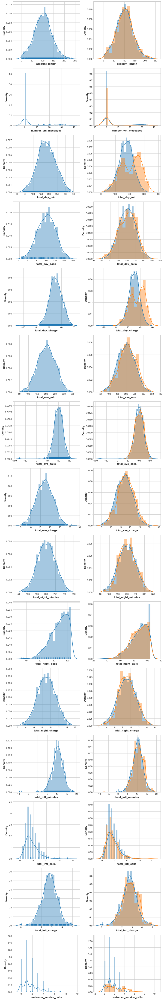

In [20]:
fig, axs = plt.subplots(len(numerical), 2, figsize=(10, 4*len(numerical)))
for i,f in enumerate(numerical):
    # print(i,f)
    sns.distplot(df_train[f],rug=True,ax=axs[i][0])
    sns.distplot(df_train[f][df_train.Churn=='No'],ax=axs[i][1])
    sns.distplot(df_train[f][df_train.Churn=='Yes'],ax=axs[i][1])
plt.show()

#### Check null values

In [21]:
df_train.isnull().sum()

account_length            0
location_code             0
intertiol_plan            0
voice_mail_plan           0
number_vm_messages        0
total_day_min             0
total_day_calls           0
total_day_charge          0
total_eve_min             0
total_eve_calls           0
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        0
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
Churn                     0
dtype: int64

In [22]:
df_test.isnull().sum()

account_length            0
location_code             0
intertiol_plan            0
voice_mail_plan           0
number_vm_messages        0
total_day_min             0
total_day_calls           0
total_day_charge          0
total_eve_min             0
total_eve_calls           0
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        0
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
dtype: int64

#### Check outliers

In [23]:
def check_outliers_by_visualisation(df,features):
    x=len(features)
    fig, axs = plt.subplots(x, 2, figsize=(10, 4*x))
    for i,f in enumerate(features):
        # print(i,f)
        sns.distplot(df[f],rug=True,ax=axs[i][0])
        sns.boxplot(x =f, data = df,ax=axs[i][1])
    plt.show()

C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2103: Fu

C:\Python\Python310\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


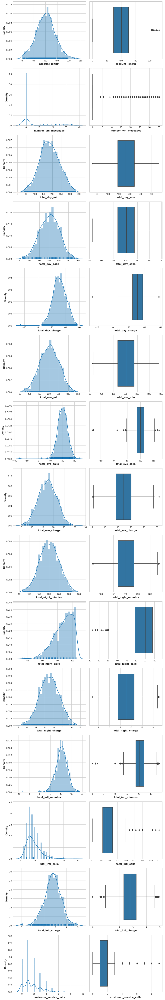

In [24]:
check_outliers_by_visualisation(df_train,numerical)

##### mark minus values as nan before the handle

In [25]:
mark_minus_invalids_as_nan(df_train, numerical)
mark_minus_invalids_as_nan(df_test, numerical)

In [26]:
df_train.isnull().sum()

account_length            0
location_code             0
intertiol_plan            0
voice_mail_plan           0
number_vm_messages        0
total_day_min             0
total_day_calls           0
total_day_charge          1
total_eve_min             0
total_eve_calls           2
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        3
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
Churn                     0
dtype: int64

In [27]:
df_test.isnull().sum()

account_length            0
location_code             0
intertiol_plan            0
voice_mail_plan           0
number_vm_messages        0
total_day_min             0
total_day_calls           0
total_day_charge          2
total_eve_min             0
total_eve_calls           0
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        0
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
dtype: int64

#### checking null values suggested the boundry for it

In [28]:
suggested_bounds = {'account_length': [0, 250],
                    'number_vm_messages': [0, 51],
                    'total_day_min': [0, 500],
                    'total_day_calls': [0, 800],
                    'total_day_charge': [0, 61],
                    'total_eve_min': [0, 800],
                    'total_eve_calls': [0, 170],
                    'total_eve_charge': [0, 31],
                    'total_night_minutes': [0, 800],
                    'total_night_calls': [0, 175],
                    'total_night_charge': [0, 200],
                    'total_intl_minutes': [0, 25],
                    'total_intl_calls': [0, 20],
                    'total_intl_charge': [0, 10],
                    'customer_service_calls': [0, 10]}

In [29]:
df_train = set_nan(df_train, suggested_bounds)
df_test = set_nan(df_test, suggested_bounds)

In [30]:
df_train.isnull().sum()

account_length            0
location_code             0
intertiol_plan            0
voice_mail_plan           0
number_vm_messages        0
total_day_min             0
total_day_calls           0
total_day_charge          1
total_eve_min             0
total_eve_calls           2
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        3
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
Churn                     0
dtype: int64

In [31]:
df_test.isnull().sum()

account_length            0
location_code             0
intertiol_plan            0
voice_mail_plan           0
number_vm_messages        0
total_day_min             0
total_day_calls           0
total_day_charge          2
total_eve_min             0
total_eve_calls           0
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        0
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
dtype: int64

##### Correlations helps to handle nan values

<AxesSubplot:>

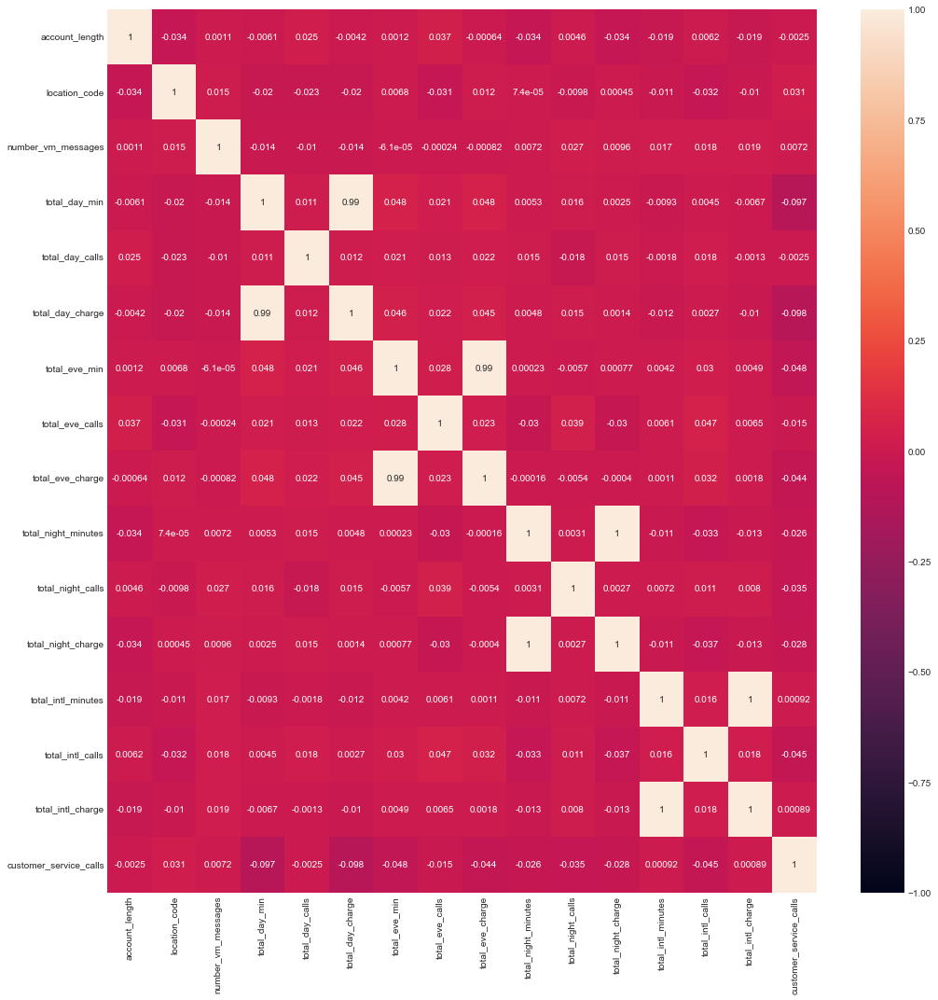

In [32]:
corr_train = df_train.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_train, vmin=-1, vmax=1, annot=True)

<AxesSubplot:>

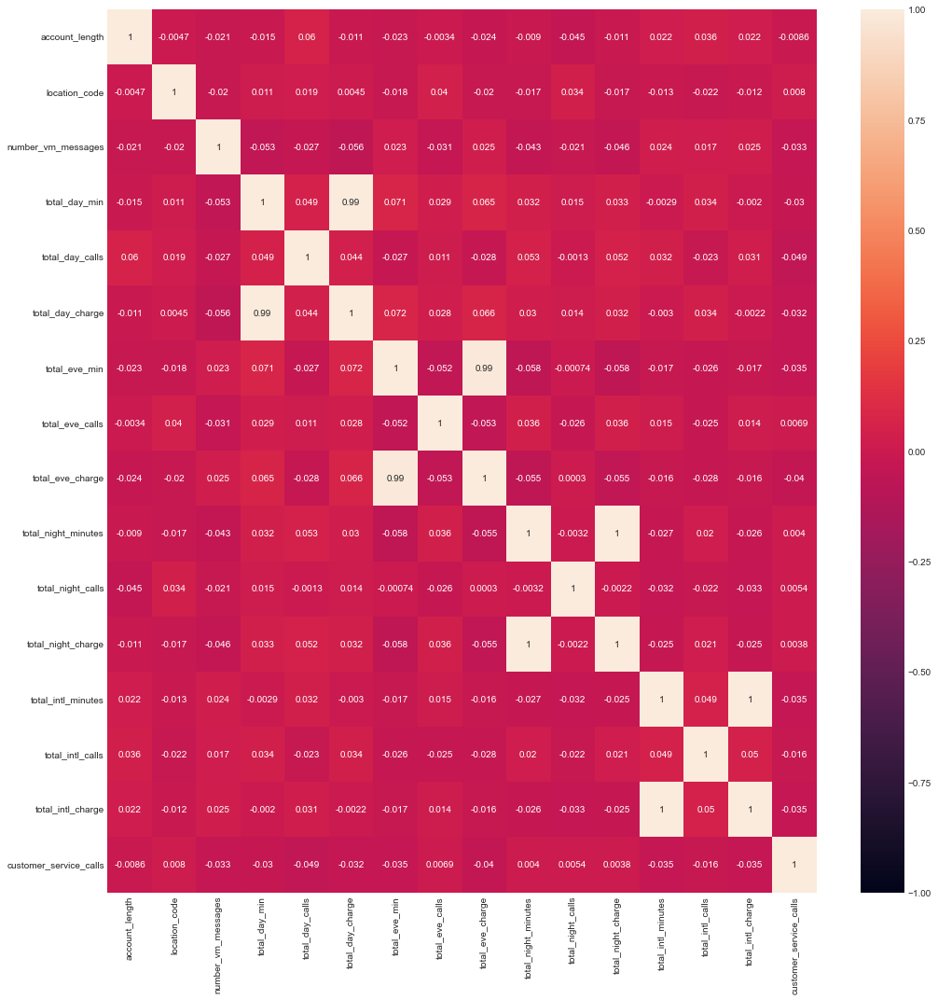

In [33]:
corr_test = df_test.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_test, vmin=-1, vmax=1, annot=True)

<AxesSubplot:>

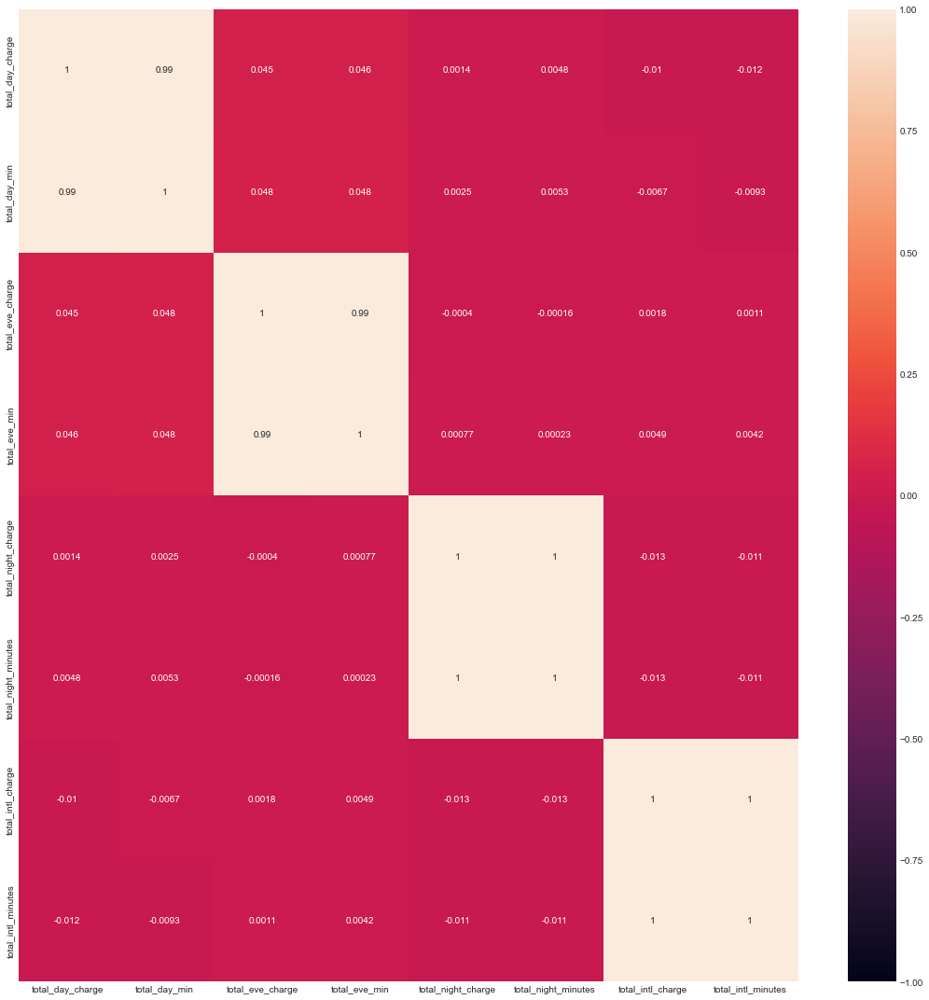

In [34]:
correlations_columns = ['total_day_charge', 'total_day_min','total_eve_charge', 'total_eve_min',
                        'total_night_charge', 'total_night_minutes','total_intl_charge', 'total_intl_minutes']

corr_test = df_train[correlations_columns].corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_test, vmin=-1, vmax=1, annot=True)                    

##### handle highly correlated fields missing values

In [35]:
correlated_sets = [['total_day_charge', 'total_day_min'],
                   ['total_eve_charge', 'total_eve_min'],
                   ['total_night_charge', 'total_night_minutes'],
                   ['total_intl_charge', 'total_intl_minutes']]

In [36]:
df_train = regression_imputation(df_train, correlated_sets)
df_test = regression_imputation(df_test, correlated_sets)

C:\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\NIPUN_THEJAN\AppData\Local\Temp\ipykernel_16808\3010774900.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[s[0]][i] = lr_1.predict(v)[0][0]
C:\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\NIPUN_THEJAN\AppData\Local\Temp\ipykernel_16808\3010774900.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-c

##### handle rest of outliers by

<AxesSubplot:>

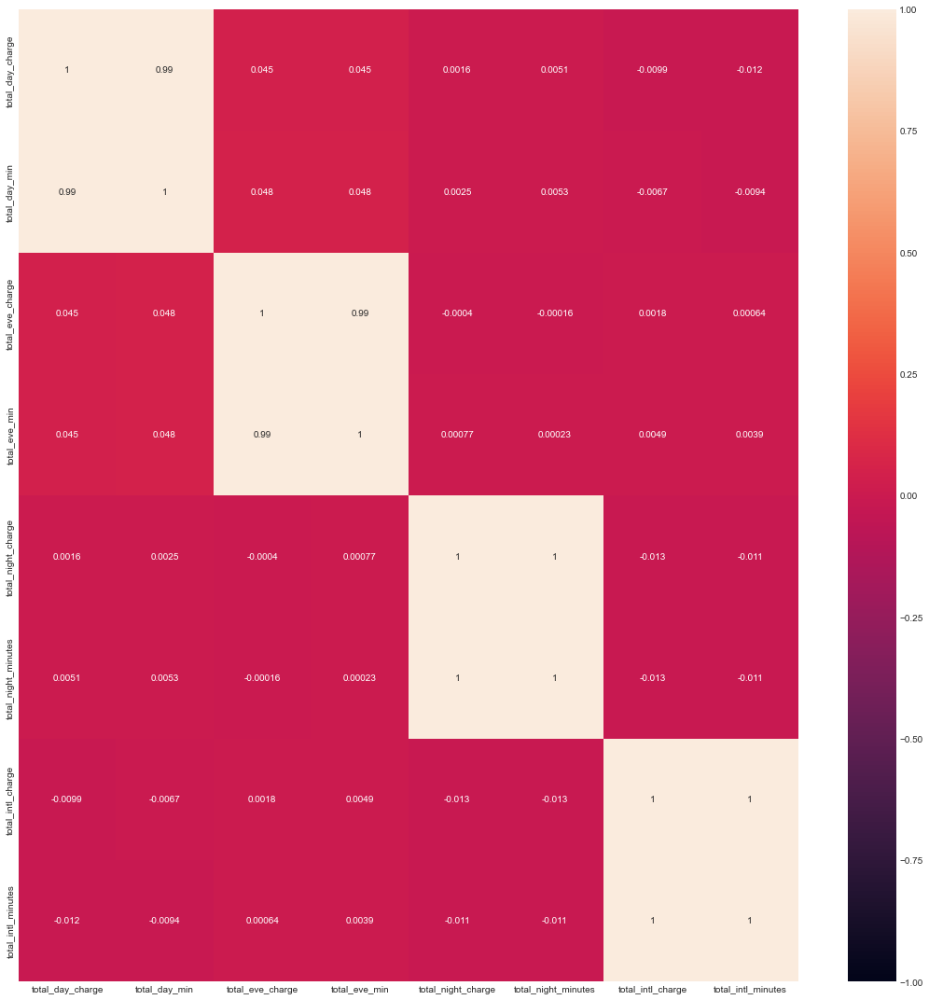

In [37]:
corr_test = df_train[correlations_columns].corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_test, vmin=-1, vmax=1, annot=True) 

In [38]:
# for numerical
df_train = handle_missing_by_median(df_train, numerical)
df_test = handle_missing_by_median(df_test, numerical)

In [39]:
# for categorical
df_train = categorical_features_imputation_by_mode(df_train, train_categorical)
df_test = categorical_features_imputation_by_mode(df_test, test_categorical)

In [40]:
df_train.isnull().sum()

account_length            0
location_code             0
intertiol_plan            0
voice_mail_plan           0
number_vm_messages        0
total_day_min             0
total_day_calls           0
total_day_charge          0
total_eve_min             0
total_eve_calls           0
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        0
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
Churn                     0
dtype: int64

In [41]:
df_test.isnull().sum()

account_length            0
location_code             0
intertiol_plan            0
voice_mail_plan           0
number_vm_messages        0
total_day_min             0
total_day_calls           0
total_day_charge          0
total_eve_min             0
total_eve_calls           0
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        0
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
dtype: int64

<AxesSubplot:>

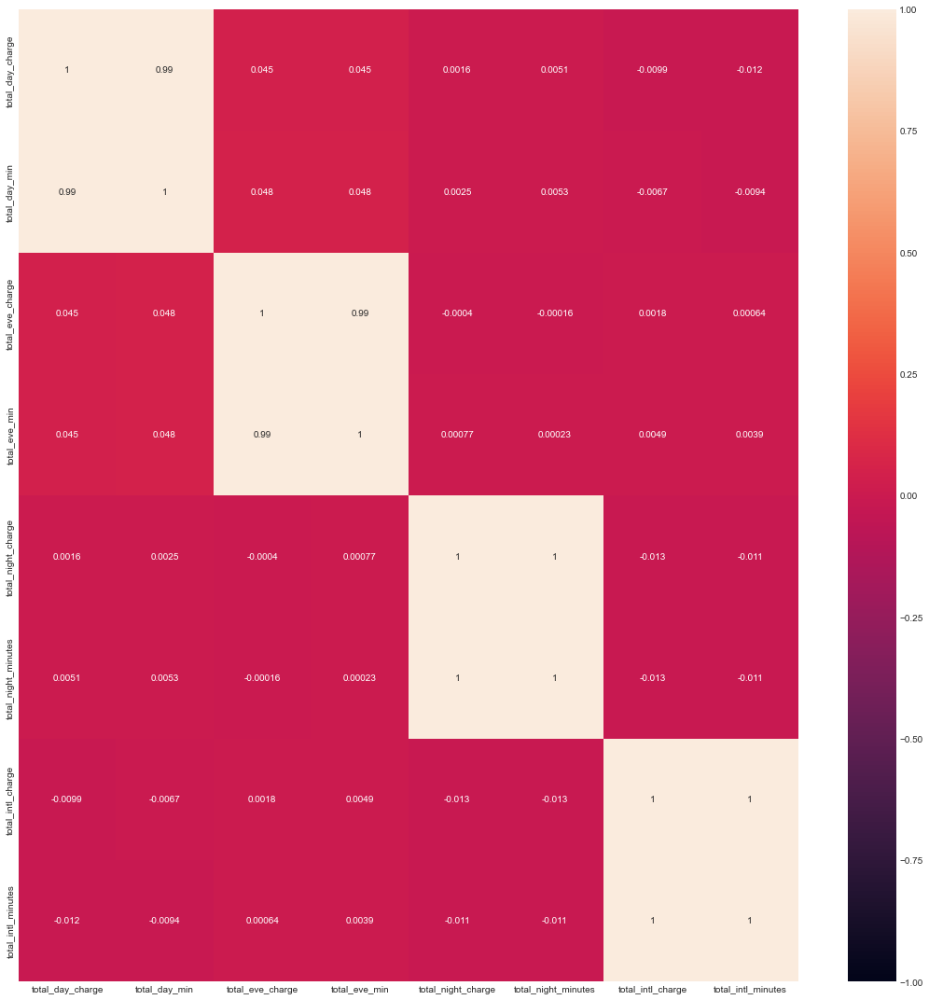

In [42]:
corr_test_c = df_train[correlations_columns].corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_test_c, vmin=-1, vmax=1, annot=True)

# Encoding

#### encoding international plan

In [43]:
df_train.intertiol_plan.replace('no',0,inplace=True)
df_train.intertiol_plan.replace('yes',1,inplace=True)

df_test.intertiol_plan.replace('no',0,inplace=True)
df_test.intertiol_plan.replace('yes',1,inplace=True)

#### encoding voice mail plan

In [44]:
df_train.voice_mail_plan.replace('no',0,inplace=True)
df_train.voice_mail_plan.replace('yes',1,inplace=True)

df_test.voice_mail_plan.replace('no',0,inplace=True)
df_test.voice_mail_plan.replace('yes',1,inplace=True)


#### encoding Churn

In [45]:
df_train.Churn.replace('No',0,inplace=True)
df_train.Churn.replace('Yes',1,inplace=True)

In [46]:
def one_hot_encoding(df,feature):
    data =df.copy()
    onehot = OneHotEncoder()
    onehot.fit(data[[feature]])

    encoded = onehot.transform(data[[feature]])
    data[onehot.categories_[0]] = encoded.toarray()
    return data.drop(feature, axis=1)


In [47]:
df_train=one_hot_encoding(df_train,'location_code')
df_test=one_hot_encoding(df_test,'location_code')

In [48]:
df_train.head()

,account_length,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,...,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn,445,452,547
0,15.0,0,0,0.0,121.1,130.0,20.59,216.0,86.0,18.36,...,33.0,10.58,16.1,5.0,4.35,2.0,0,0.0,1.0,0.0
1,105.0,0,0,0.0,259.3,96.0,44.08,175.2,97.0,14.89,...,36.0,10.01,12.0,5.0,3.24,3.0,0,0.0,1.0,0.0
2,97.0,0,1,32.0,183.4,94.0,31.18,269.1,120.0,22.87,...,38.0,9.16,6.7,4.0,1.81,5.0,0,0.0,1.0,0.0
3,121.0,0,1,35.0,68.7,95.0,11.68,209.2,69.0,17.78,...,42.0,8.88,11.4,4.0,3.08,1.0,0,1.0,0.0,0.0
4,98.0,0,1,22.0,278.3,89.0,47.31,93.4,143.0,7.94,...,42.0,4.84,9.7,5.0,2.62,0.0,0,0.0,1.0,0.0


#### Pearsoner

In [49]:
# def pearsonr(x, y):
#     # Assume len(x) == len(y)
#     n = len(x)
#     sum_x = float(sum(x))
#     sum_y = float(sum(y))
#     sum_x_sq = sum(xi*xi for xi in x)
#     sum_y_sq = sum(yi*yi for yi in y)
#     psum = sum(xi*yi for xi, yi in zip(x, y))
#     num = psum - (sum_x * sum_y/n)
#     den = pow((sum_x_sq - pow(sum_x, 2) / n) * (sum_y_sq - pow(sum_y, 2) / n), 0.5)
#     if den == 0: return 0
#     return num / den

In [50]:
# pearsonr(df_train['total_day_charge'], df_train['total_day_min'])

In [51]:
def compare_2(df,x,y):
    graph = sns.jointplot(data=df,x=x, y=y ,kind='reg')
    r, p = stats.pearsonr(df[x], df[y])
    # if you choose to write your own legend, then you should adjust the properties then
    phantom, = graph.ax_joint.plot([], [], linestyle="", alpha=0)
    # here graph is not a ax but a joint grid, so we access the axis through ax_joint method

    graph.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])


In [52]:
# def joint_plot(df,target,features):
#     for fea in  features:
#         compare_2(df_train,x=fea,y=target)


In [53]:
# joint_plot(df_train,'Churn',features=numerical)

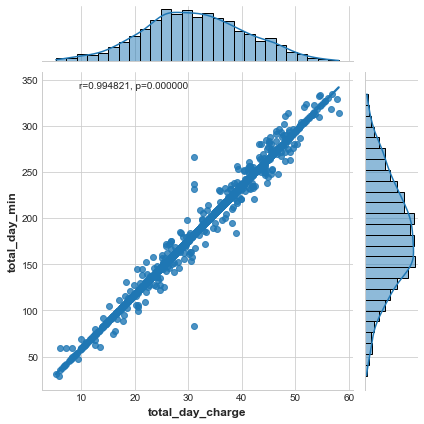

In [54]:
compare_2(df_train,x='total_day_charge',y='total_day_min')

<AxesSubplot:>

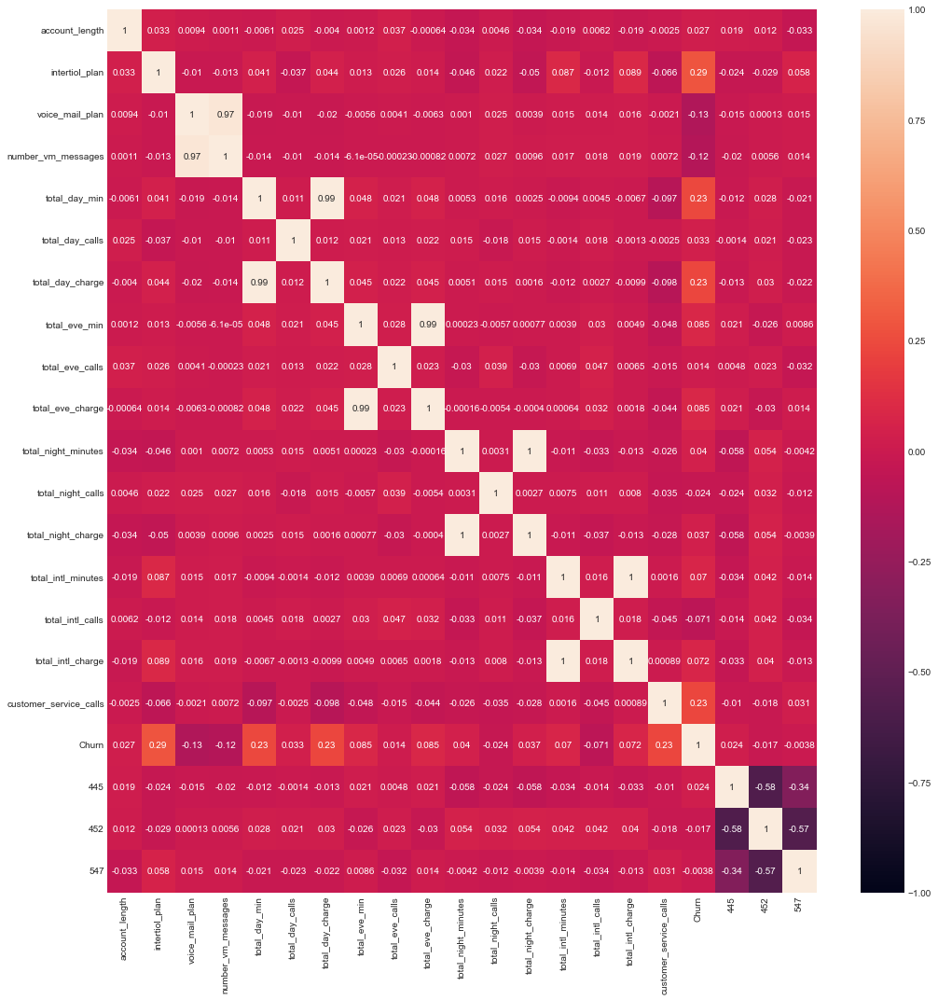

In [55]:
corr_train = df_train.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_train, vmin=-1, vmax=1, annot=True)

In [56]:
numerical

['account_length',
 'number_vm_messages',
 'total_day_min',
 'total_day_calls',
 'total_day_charge',
 'total_eve_min',
 'total_eve_calls',
 'total_eve_charge',
 'total_night_minutes',
 'total_night_calls',
 'total_night_charge',
 'total_intl_minutes',
 'total_intl_calls',
 'total_intl_charge',
 'customer_service_calls']

#### Add new features

In [57]:
df_train['total_charge']= df_train['total_intl_charge']+df_train['total_night_charge']+df_train['total_eve_charge']+df_train['total_day_charge']
df_test['total_charge']= df_test['total_intl_charge']+df_test['total_night_charge']+df_test['total_eve_charge']+df_test['total_day_charge']

In [58]:
df_train['total_calls']= df_train['total_intl_calls']+df_train['total_night_calls']+df_train['total_eve_calls']+df_train['total_day_calls']
df_test['total_calls']= df_test['total_intl_calls']+df_test['total_night_calls']+df_test['total_eve_calls']+df_test['total_day_calls']

In [59]:
df_train['total_min']= df_train['total_intl_minutes']+df_train['total_night_minutes']+df_train['total_eve_min']+df_train['total_day_min']
df_test['total_min']= df_test['total_intl_minutes']+df_test['total_night_minutes']+df_test['total_eve_min']+df_test['total_day_min']

<AxesSubplot:>

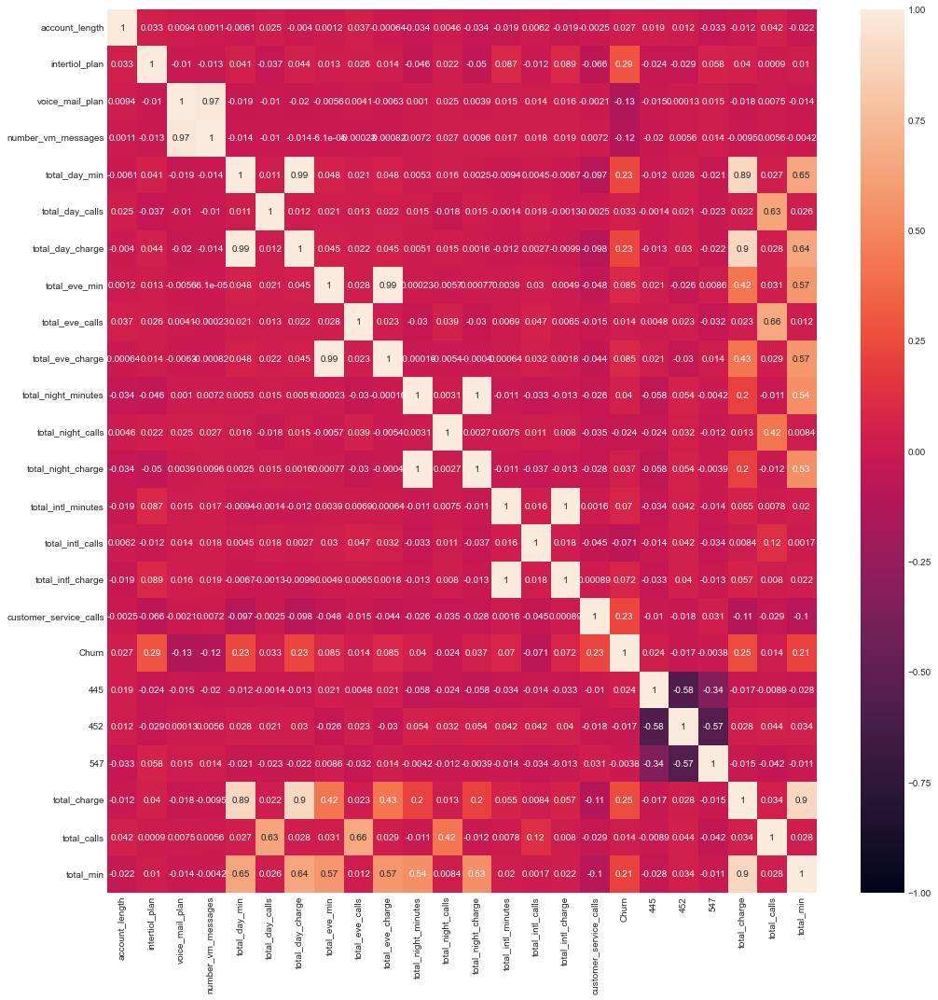

In [60]:
corr_train = df_train.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_train, vmin=-1, vmax=1, annot=True)

In [61]:
df_train.head()

,account_length,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,...,total_intl_calls,total_intl_charge,customer_service_calls,Churn,445,452,547,total_charge,total_calls,total_min
0,15.0,0,0,0.0,121.1,130.0,20.59,216.0,86.0,18.36,...,5.0,4.35,2.0,0,0.0,1.0,0.0,53.88,254.0,588.3
1,105.0,0,0,0.0,259.3,96.0,44.08,175.2,97.0,14.89,...,5.0,3.24,3.0,0,0.0,1.0,0.0,72.22,234.0,668.9
2,97.0,0,1,32.0,183.4,94.0,31.18,269.1,120.0,22.87,...,4.0,1.81,5.0,0,0.0,1.0,0.0,65.02,256.0,662.7
3,121.0,0,1,35.0,68.7,95.0,11.68,209.2,69.0,17.78,...,4.0,3.08,1.0,0,1.0,0.0,0.0,41.42,210.0,486.7
4,98.0,0,1,22.0,278.3,89.0,47.31,93.4,143.0,7.94,...,5.0,2.62,0.0,0,0.0,1.0,0.0,62.71,279.0,489.0


In [62]:
df_train["no_of_plans"] = df_train['intertiol_plan']+df_train['voice_mail_plan']
df_test['no_of_plans'] =df_test['intertiol_plan']+df_test['voice_mail_plan']

In [63]:
df_train

,account_length,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,...,total_intl_charge,customer_service_calls,Churn,445,452,547,total_charge,total_calls,total_min,no_of_plans
0,15.0,0,0,0.0,121.1,130.0,20.59,216.0,86.0,18.36,...,4.35,2.0,0,0.0,1.0,0.0,53.88,254.0,588.3,0
1,105.0,0,0,0.0,259.3,96.0,44.08,175.2,97.0,14.89,...,3.24,3.0,0,0.0,1.0,0.0,72.22,234.0,668.9,0
2,97.0,0,1,32.0,183.4,94.0,31.18,269.1,120.0,22.87,...,1.81,5.0,0,0.0,1.0,0.0,65.02,256.0,662.7,1
3,121.0,0,1,35.0,68.7,95.0,11.68,209.2,69.0,17.78,...,3.08,1.0,0,1.0,0.0,0.0,41.42,210.0,486.7,1
4,98.0,0,1,22.0,278.3,89.0,47.31,93.4,143.0,7.94,...,2.62,0.0,0,0.0,1.0,0.0,62.71,279.0,489.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2103,109.0,0,0,0.0,180.0,100.0,30.60,229.0,103.0,19.47,...,2.11,3.0,0,0.0,1.0,0.0,58.45,316.0,556.2,0
2104,185.0,1,1,30.0,154.1,114.0,26.20,118.7,106.0,10.09,...,3.48,2.0,0,0.0,1.0,0.0,51.40,328.0,544.1,2
2105,55.0,1,0,0.0,188.9,88.0,34.62,270.1,105.0,22.77,...,3.86,1.0,1,0.0,1.0,0.0,70.42,303.0,683.0,1
2106,138.0,1,0,0.0,191.2,130.0,32.35,164.5,88.0,14.00,...,4.10,0.0,1,0.0,0.0,1.0,60.91,324.0,612.3,1


<AxesSubplot:>

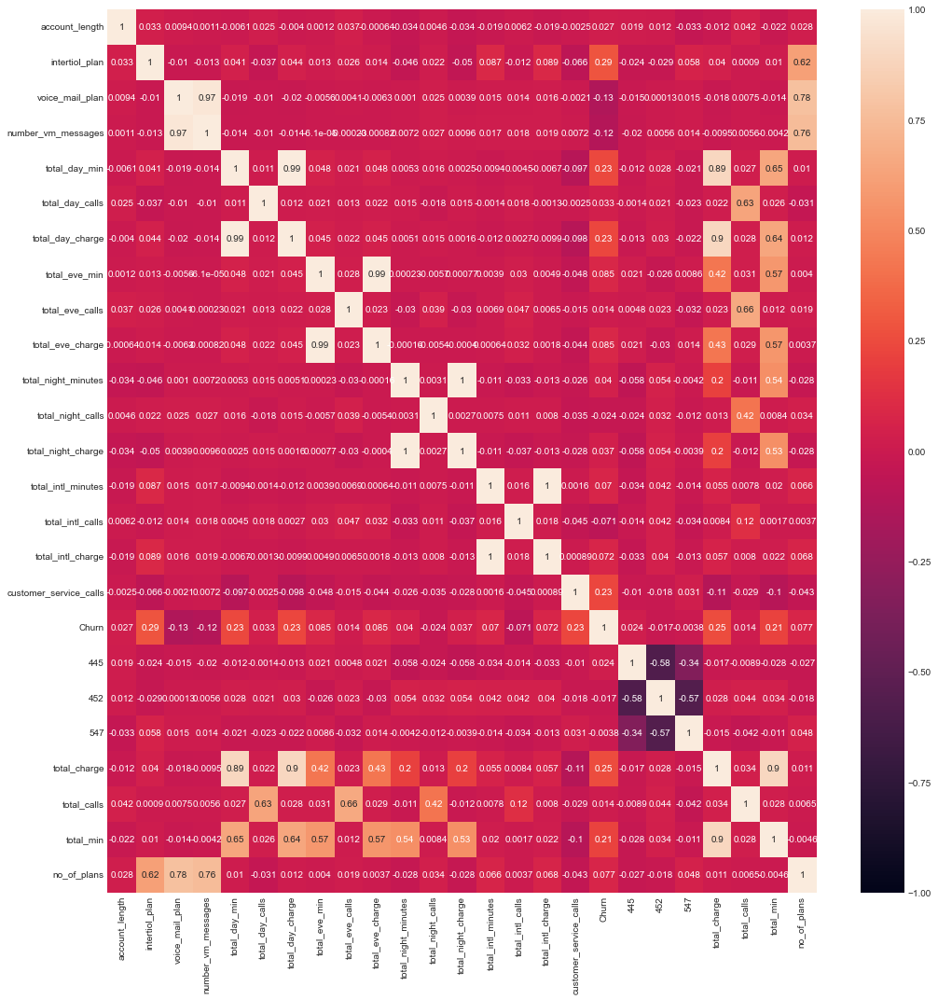

In [64]:
corr_train = df_train.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_train, vmin=-1, vmax=1, annot=True)

In [65]:
df_train['avg_call_mins'] = df_train['total_min']/df_train['total_calls']
df_test['avg_call_mins'] = df_test['total_min']/df_test['total_calls']

<AxesSubplot:>

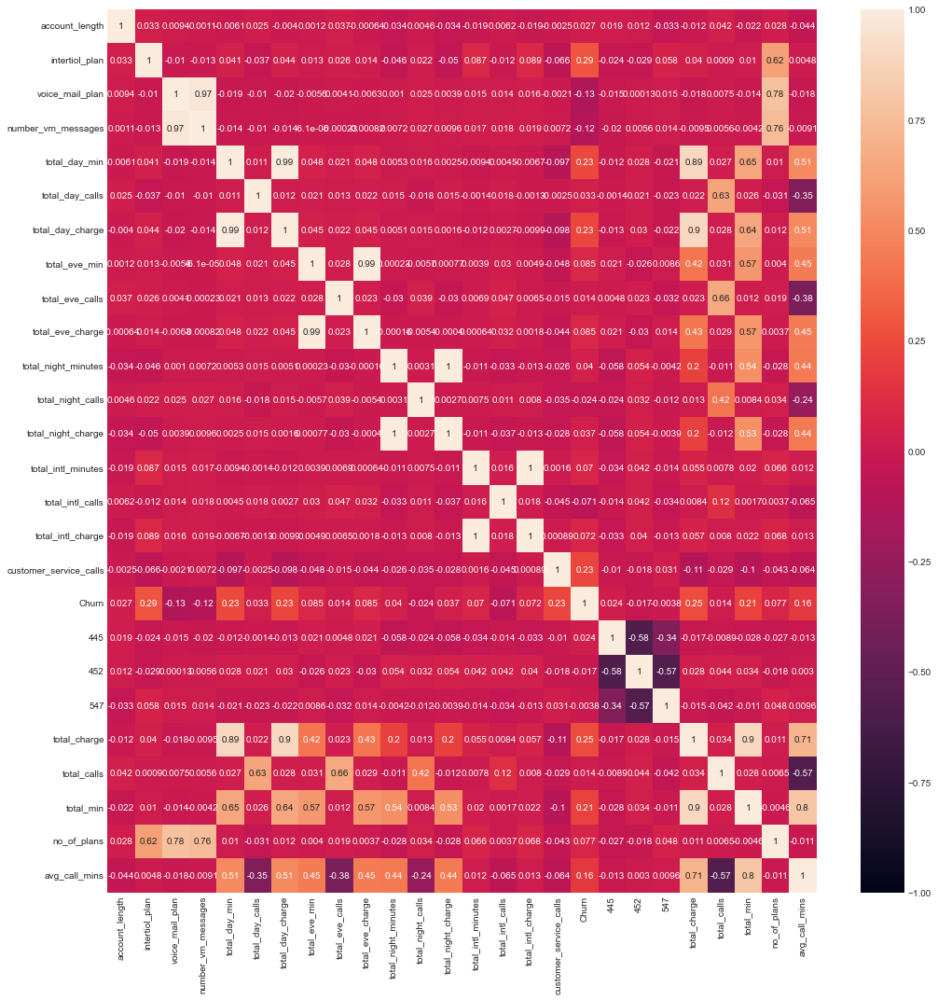

In [66]:
corr_train = df_train.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_train, vmin=-1, vmax=1, annot=True)

In [67]:
df_train.columns

Index([        'account_length',         'intertiol_plan',
              'voice_mail_plan',     'number_vm_messages',
                'total_day_min',        'total_day_calls',
             'total_day_charge',          'total_eve_min',
              'total_eve_calls',       'total_eve_charge',
          'total_night_minutes',      'total_night_calls',
           'total_night_charge',     'total_intl_minutes',
             'total_intl_calls',      'total_intl_charge',
       'customer_service_calls',                  'Churn',
                            445,                      452,
                            547,           'total_charge',
                  'total_calls',              'total_min',
                  'no_of_plans',          'avg_call_mins'],
      dtype='object')

In [68]:
cols =[        'account_length',         'intertiol_plan',
              'voice_mail_plan',     'number_vm_messages',
                'total_day_min',        'total_day_calls',
             'total_day_charge',          'total_eve_min',
              'total_eve_calls',       'total_eve_charge',
          'total_night_minutes',      'total_night_calls',
           'total_night_charge',     'total_intl_minutes',
             'total_intl_calls',      'total_intl_charge',
       'customer_service_calls',                  
                            445,                      452,
                            547,           'total_charge',
                  'total_calls',              'total_min',
                  'no_of_plans',          'avg_call_mins']

In [69]:
def feature_importance(dataframe,features,target,model):
    model.fit(dataframe[features],dataframe[target])
    impos = model.coef_[0]
    for i,v in enumerate(impos):
        print('%0d Feature: %s   , Score: %.5f' % (i,features[i],v))

    plt.bar([str(features[x]) for x in range(len(impos))], impos)
    plt.xticks(rotation=90)
    plt.show()

In [70]:
from sklearn.ensemble import RandomForestClassifier
#%%
def feature_importance_trees(dataframe,features,target,model):
    model.fit(dataframe[features],dataframe[target])
    impos = model.feature_importances_
    for i,v in enumerate(impos):
        print('%0d Feature: %s   , Score: %.5f' % (i,features[i],v))

    plt.bar([x for x in range(len(impos))], impos)
    plt.xticks(rotation=90)
    plt.show()

In [71]:
from sklearn.inspection import permutation_importance

In [72]:
def feature_importance_permutation(dataframe,features,target,model):
    model.fit(dataframe[features],dataframe[target])
    results = permutation_importance(model,dataframe[features],dataframe[target], scoring='accuracy')
    impos = results.importances_mean
    for i,v in enumerate(impos):
        print('%0d Feature: %s   , Score: %.5f' % (i,features[i],v))

    plt.bar([x for x in range(len(impos))], impos)
    plt.xticks(rotation=90)
    plt.show()

C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(


0 Feature: account_length   , Score: 0.02315
1 Feature: intertiol_plan   , Score: 0.06821
2 Feature: voice_mail_plan   , Score: 0.02005
3 Feature: number_vm_messages   , Score: 0.02964
4 Feature: total_day_min   , Score: 0.07141
5 Feature: total_day_calls   , Score: 0.01835
6 Feature: total_day_charge   , Score: 0.07639
7 Feature: total_eve_min   , Score: 0.02376
8 Feature: total_eve_calls   , Score: 0.01620
9 Feature: total_eve_charge   , Score: 0.02506
10 Feature: total_night_minutes   , Score: 0.02086
11 Feature: total_night_calls   , Score: 0.01505
12 Feature: total_night_charge   , Score: 0.02156
13 Feature: total_intl_minutes   , Score: 0.02922
14 Feature: total_intl_calls   , Score: 0.03415
15 Feature: total_intl_charge   , Score: 0.02910
16 Feature: customer_service_calls   , Score: 0.15465
17 Feature: 445   , Score: 0.00216
18 Feature: 452   , Score: 0.00245
19 Feature: 547   , Score: 0.00261
20 Feature: total_charge   , Score: 0.18389
21 Feature: total_calls   , Score: 0.0204

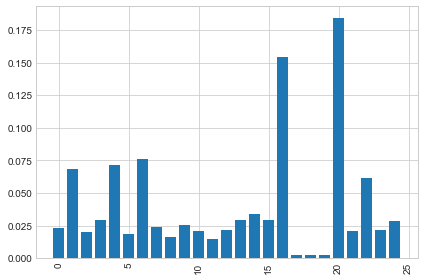

In [73]:
feature_importance_trees(dataframe=df_train,features=cols,target='Churn',model=RandomForestClassifier())

0 Feature: account_length   , Score: 0.01417
1 Feature: intertiol_plan   , Score: 0.10473
2 Feature: voice_mail_plan   , Score: 0.23957
3 Feature: number_vm_messages   , Score: 0.02695
4 Feature: total_day_min   , Score: 0.02047
5 Feature: total_day_calls   , Score: 0.01391
6 Feature: total_day_charge   , Score: 0.01767
7 Feature: total_eve_min   , Score: 0.01845
8 Feature: total_eve_calls   , Score: 0.01141
9 Feature: total_eve_charge   , Score: 0.01224
10 Feature: total_night_minutes   , Score: 0.01096
11 Feature: total_night_calls   , Score: 0.01236
12 Feature: total_night_charge   , Score: 0.01276
13 Feature: total_intl_minutes   , Score: 0.01076
14 Feature: total_intl_calls   , Score: 0.05699
15 Feature: total_intl_charge   , Score: 0.05937
16 Feature: customer_service_calls   , Score: 0.10282
17 Feature: 445   , Score: 0.02183
18 Feature: 452   , Score: 0.01307
19 Feature: 547   , Score: 0.00646
20 Feature: total_charge   , Score: 0.16489
21 Feature: total_calls   , Score: 0.0148

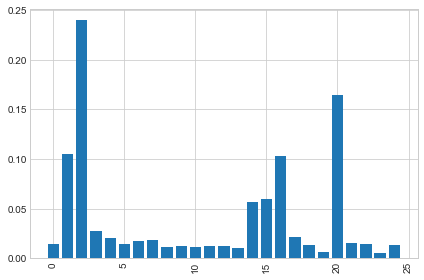

In [74]:
feature_importance_trees(dataframe=df_train,features=cols,target='Churn',model=XGBClassifier())

In [75]:
from sklearn.neighbors import KNeighborsClassifier

C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sk

C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sk

C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sk

C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sk

0 Feature: account_length   , Score: 0.02979
1 Feature: intertiol_plan   , Score: 0.00000
2 Feature: voice_mail_plan   , Score: 0.00000
3 Feature: number_vm_messages   , Score: 0.00503
4 Feature: total_day_min   , Score: 0.09440
5 Feature: total_day_calls   , Score: 0.00977
6 Feature: total_day_charge   , Score: 0.00228
7 Feature: total_eve_min   , Score: 0.03605
8 Feature: total_eve_calls   , Score: 0.00531
9 Feature: total_eve_charge   , Score: 0.00095
10 Feature: total_night_minutes   , Score: 0.04402
11 Feature: total_night_calls   , Score: 0.00361
12 Feature: total_night_charge   , Score: 0.00028
13 Feature: total_intl_minutes   , Score: 0.00028
14 Feature: total_intl_calls   , Score: 0.00057
15 Feature: total_intl_charge   , Score: 0.00066
16 Feature: customer_service_calls   , Score: 0.00199
17 Feature: 445   , Score: 0.00000
18 Feature: 452   , Score: 0.00019
19 Feature: 547   , Score: 0.00019
20 Feature: total_charge   , Score: 0.00218
21 Feature: total_calls   , Score: 0.0160

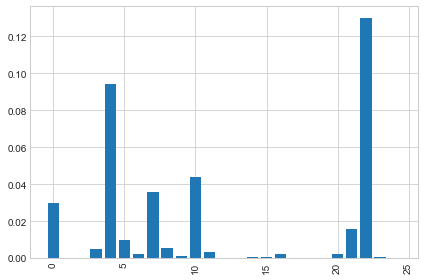

In [76]:
feature_importance_permutation(dataframe=df_train,features=cols,target='Churn',model=KNeighborsClassifier())

C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0 Feature: account_length   , Score: -0.00096
1 Feature: intertiol_plan   , Score: 1.08674
2 Feature: voice_mail_plan   , Score: -0.08157
3 Feature: number_vm_messages   , Score: -0.06404
4 Feature: total_day_min   , Score: 0.00327
5 Feature: total_day_calls   , Score: 0.02190
6 Feature: total_day_charge   , Score: 0.03300
7 Feature: total_eve_min   , Score: -0.00236
8 Feature: total_eve_calls   , Score: 0.01807
9 Feature: total_eve_charge   , Score: -0.02365
10 Feature: total_night_minutes   , Score: -0.00455
11 Feature: total_night_calls   , Score: 0.00258
12 Feature: total_night_charge   , Score: -0.07932
13 Feature: total_intl_minutes   , Score: 0.01622
14 Feature: total_intl_calls   , Score: -0.07138
15 Feature: total_intl_charge   , Score: 0.01578
16 Feature: customer_service_calls   , Score: 0.48152
17 Feature: 445   , Score: 0.04065
18 Feature: 452   , Score: -0.13235
19 Feature: 547   , Score: -0.09991
20 Feature: total_charge   , Score: -0.05419
21 Feature: total_calls   , Sc

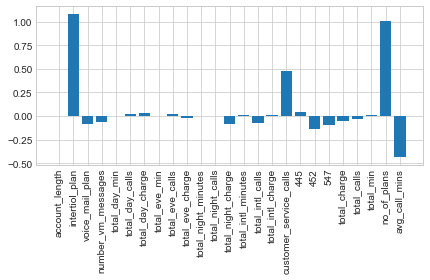

In [77]:
feature_importance(dataframe=df_train,features=cols,target='Churn',model=LogisticRegression(max_iter=200))

Feature Importances :  [0.0141724  0.10472587 0.23957483 0.02694974 0.02046845 0.01390665
 0.01766522 0.01845367 0.01141406 0.01224082 0.01095933 0.0123616
 0.01275509 0.01075772 0.05699105 0.05937266 0.1028197  0.02182906
 0.01306664 0.00646431 0.16488598 0.01481162 0.0146616  0.00531872
 0.0133733 ]


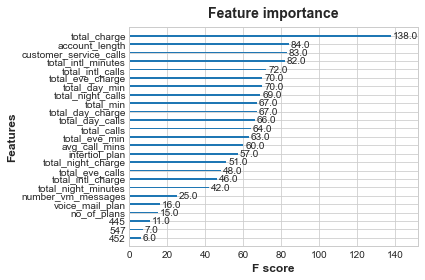

In [78]:
from xgboost import XGBClassifier
from xgboost import plot_importance

# fit model to training data
xgb_model = XGBClassifier(random_state = 0 )
xgb_model.fit(df_train[cols], df_train['Churn'])

print("Feature Importances : ", xgb_model.feature_importances_)

# plot feature importance
plot_importance(xgb_model)
plt.show()

In [79]:

X= df_train[cols]
y = df_train['Churn']

In [80]:
from sklearn.inspection import permutation_importance

forest = RandomForestClassifier(random_state=0)
forest.fit(X,y)
result = permutation_importance(
    forest,X, y, n_repeats=10, random_state=42, n_jobs=2,scoring='accuracy'
)



forest_importances = pd.Series(result.importances_mean, index=cols)

C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int64', 'str']. An error will be raised in 1.2.
  warnings.warn(


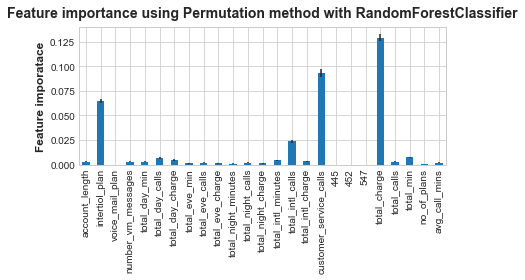

In [81]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importance using Permutation method with RandomForestClassifier")
ax.set_ylabel("Feature imporatace")
fig.tight_layout()
plt.show()

KeyboardInterrupt: 

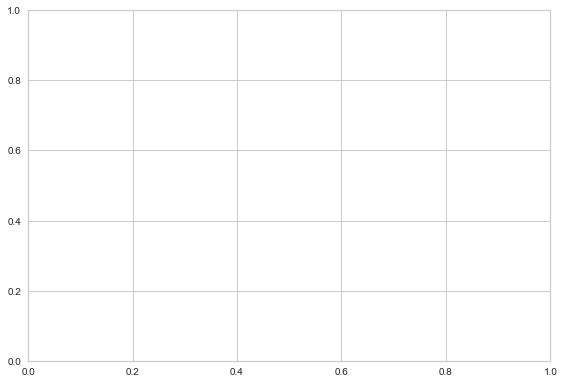

In [82]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold

from yellowbrick.model_selection import rfecv


cv = StratifiedKFold(5)
visualizer = rfecv(RandomForestClassifier(), X=X, y=y, cv=cv, scoring='f1_weighted')

In [ ]:
cv = StratifiedKFold(5)
visualizer = rfecv(XGBClassifier(random_state = 0 ), X=X, y=y, cv=cv, scoring='f1_weighted')

In [83]:
Index([        'account_length',         'intertiol_plan',
              'voice_mail_plan',     'number_vm_messages',
                'total_day_min',        'total_day_calls',
             'total_day_charge',          'total_eve_min',
              'total_eve_calls',       'total_eve_charge',
          'total_night_minutes',      'total_night_calls',
           'total_night_charge',     'total_intl_minutes',
             'total_intl_calls',      'total_intl_charge',
       'customer_service_calls',                  'Churn',
                            445,                      452,
                            547,           'total_charge',
                  'total_calls',              'total_min',
                  'no_of_plans',          'avg_call_mins'],
      dtype='object')

NameError: name 'Index' is not defined

In [84]:
df_train[['total_eve_calls','total_intl_calls','total_night_calls','total_day_calls']]

,total_eve_calls,total_intl_calls,total_night_calls,total_day_calls
0,86.0,5.0,33.0,130.0
1,97.0,5.0,36.0,96.0
2,120.0,4.0,38.0,94.0
3,69.0,4.0,42.0,95.0
4,143.0,5.0,42.0,89.0
...,...,...,...,...
2103,103.0,8.0,105.0,100.0
2104,106.0,3.0,105.0,114.0
2105,105.0,5.0,105.0,88.0
2106,88.0,1.0,105.0,130.0


In [85]:
data = {
    'mean_call': [df_train['total_eve_calls'].mean(), df_train['total_intl_calls'].mean(), df_train['total_night_calls'].mean(),df_train['total_day_calls'].mean()],
    'mean_mins': [df_train['total_eve_min'].mean(), df_train['total_intl_minutes'].mean(), df_train['total_night_minutes'].mean(),df_train['total_day_min'].mean()]
    }

calls_df_mean = pd.DataFrame(data, index=['eve','intl','night','day'])

In [86]:
calls_df_mean

,mean_call,mean_mins
eve,100.272443,202.037815
intl,4.410926,10.274716
night,87.679981,201.243495
day,100.872684,183.331799


<AxesSubplot:xlabel='Count', ylabel='mean_call'>

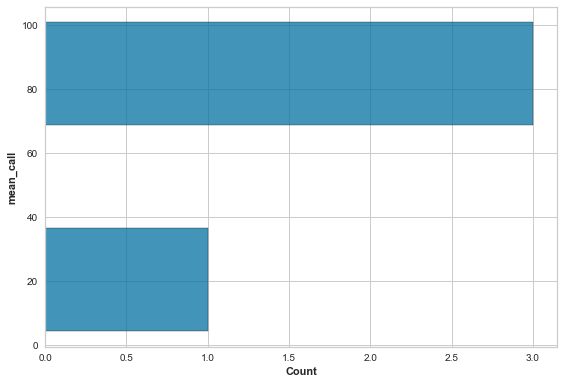

In [87]:
sns.histplot(data=calls_df_mean, y="mean_call")

In [88]:
calls_df_mean['mean_avg_mins_for_call'] = calls_df_mean['mean_mins']/calls_df_mean['mean_call']
calls_df_mean

,mean_call,mean_mins,mean_avg_mins_for_call
eve,100.272443,202.037815,2.014889
intl,4.410926,10.274716,2.329378
night,87.679981,201.243495,2.295205
day,100.872684,183.331799,1.817457


Text(0.5, 1.0, 'Mean avg minutes taken for call vs type of call')

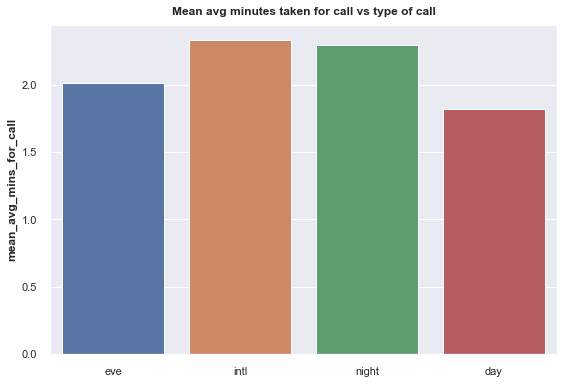

In [89]:
sns.set()
sns.barplot(x=calls_df_mean.index,y=calls_df_mean.mean_avg_mins_for_call)
plt.title("Mean avg minutes taken for call vs type of call")

In [90]:
calls_df_mean.index

Index(['eve', 'intl', 'night', 'day'], dtype='object')

In [91]:
calls_df_mean.mean_call


eve      100.272443
intl       4.410926
night     87.679981
day      100.872684
Name: mean_call, dtype: float64

Text(0.5, 1.0, 'No.of calls taken by customer vs type of call')

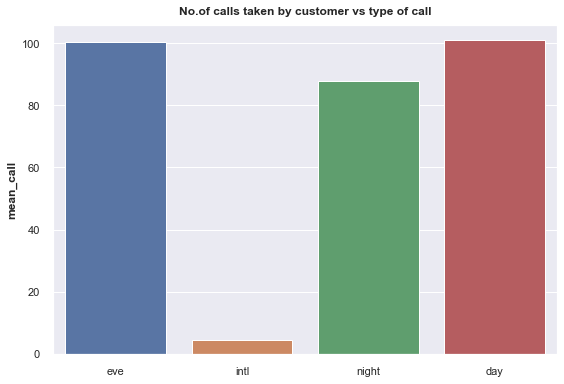

In [92]:
sns.set()
sns.barplot(x=calls_df_mean.index,y=calls_df_mean.mean_call)
# plt.settitle("No.of calls taken by customer vs type of call")
plt.title("No.of calls taken by customer vs type of call")

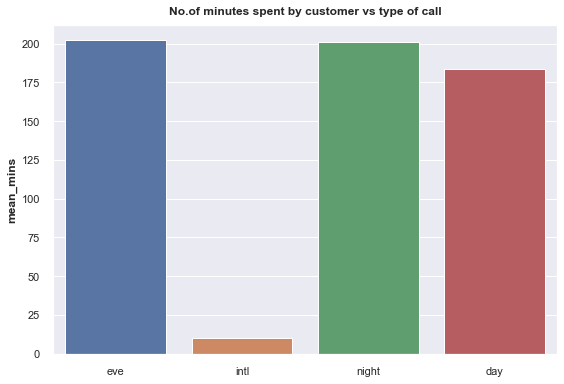

In [93]:
sns.set()
sns.barplot(x=calls_df_mean.index,y=calls_df_mean.mean_mins)
# plt.settitle("No.of calls taken by customer vs type of call")
plt.title("No.of minutes spent by customer vs type of call")
plt.show()

In [94]:
ecus_df = df_train[df_train.Churn == 0]
data_ecus = {
    'mean_call': [ecus_df['total_eve_calls'].mean(), ecus_df['total_intl_calls'].mean(), ecus_df['total_night_calls'].mean(),ecus_df['total_day_calls'].mean()],
    'mean_mins': [ecus_df['total_eve_min'].mean(), ecus_df['total_intl_minutes'].mean(), ecus_df['total_night_minutes'].mean(),ecus_df['total_day_min'].mean()]
    }

ecus_mean_df = pd.DataFrame(data_ecus, index=['eve','intl','night','day'])

In [95]:
ecus_mean_df


,mean_call,mean_mins
eve,100.114833,199.606995
intl,4.512301,10.163391
night,87.856172,200.104174
day,100.496670,175.648119


Text(0.5, 1.0, 'No.of calls taken by existing customer vs type of call')

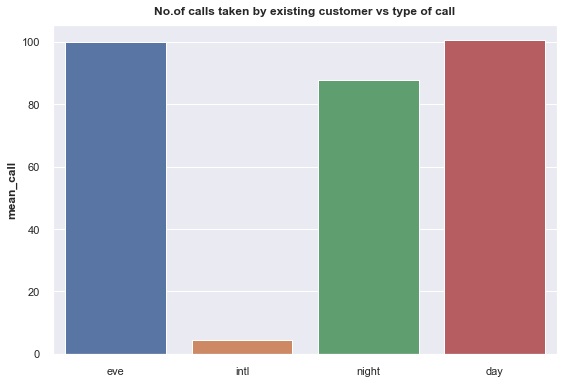

In [96]:
sns.set()
sns.barplot(x=ecus_mean_df.index,y=ecus_mean_df.mean_call)
# plt.settitle("No.of calls taken by customer vs type of call")
plt.title("No.of calls taken by existing customer vs type of call")

In [97]:
churn_df = df_train[df_train.Churn == 1]
churn_data = {
    'mean_call': [churn_df['total_eve_calls'].mean(), churn_df['total_intl_calls'].mean(), churn_df['total_night_calls'].mean(),churn_df['total_day_calls'].mean()],
    'mean_mins': [churn_df['total_eve_min'].mean(), churn_df['total_intl_minutes'].mean(), churn_df['total_night_minutes'].mean(),churn_df['total_day_min'].mean()]
    }

churn_mean_df = pd.DataFrame(churn_data, index=['eve','intl','night','day'])
churn_mean_df

,mean_call,mean_mins
eve,100.741704,209.275237
intl,4.109098,10.606170
night,87.155396,204.635660
day,101.992213,206.208868


In [98]:
ecus_mean_df

,mean_call,mean_mins
eve,100.114833,199.606995
intl,4.512301,10.163391
night,87.856172,200.104174
day,100.496670,175.648119


Text(0.5, 1.0, 'No.of calls taken by existing customer vs type of call')

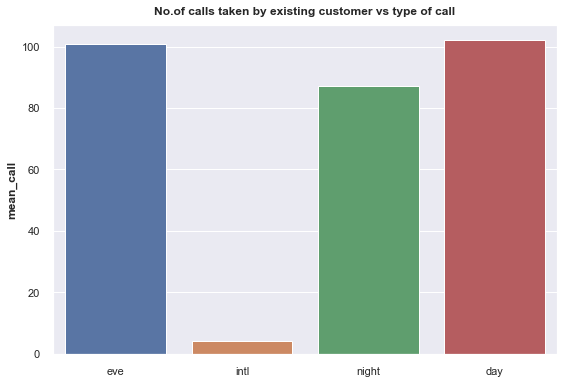

In [99]:
sns.set()
sns.barplot(x=churn_mean_df.index,y=churn_mean_df.mean_call)
# plt.settitle("No.of calls taken by customer vs type of call")
plt.title("No.of calls taken by existing customer vs type of call")

In [100]:
df_train_cleaned = pd.read_csv('/content/Train_Dataset_190649F.csv')
df_train_cleaned.head()

FileNotFoundError: [Errno 2] No such file or directory: '/content/Train_Dataset_190649F.csv'

In [ ]:
df_train_cleaned.isnull().sum()

In [137]:
sns.countplot(x='location_code', hue="Churn", data=df_train_cleaned)

NameError: name 'df_train_cleaned' is not defined

In [ ]:
sns.countplot(x='intertiol_plan', hue="Churn", data=df_train_cleaned)

In [101]:
sns.countplot(x='voice_mail_plan', hue="Churn", data=df_train_cleaned)

NameError: name 'df_train_cleaned' is not defined

<AxesSubplot:xlabel='no_of_plans', ylabel='count'>

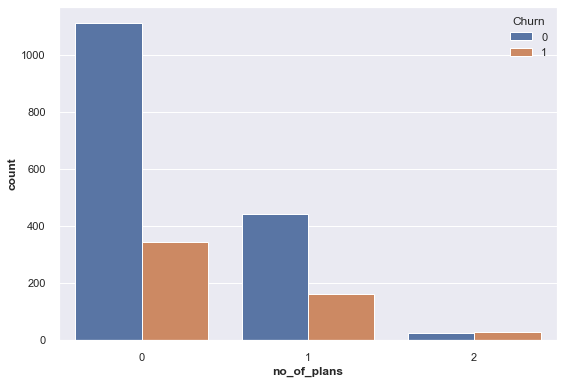

In [102]:
sns.countplot(x='no_of_plans', hue="Churn", data=df_train)

In [103]:
no_plan_customers = df_train[df_train['no_of_plans']==0]

<AxesSubplot:xlabel='no_of_plans', ylabel='total_charge'>

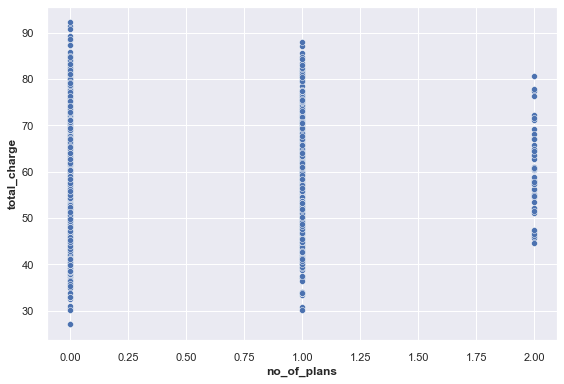

In [104]:
sns.scatterplot(data=df_train, x="no_of_plans", y="total_charge")

In [105]:
# sns.relplot( y="total_charge", hue="no_of_plans",
#             kind="line", data=df_train);

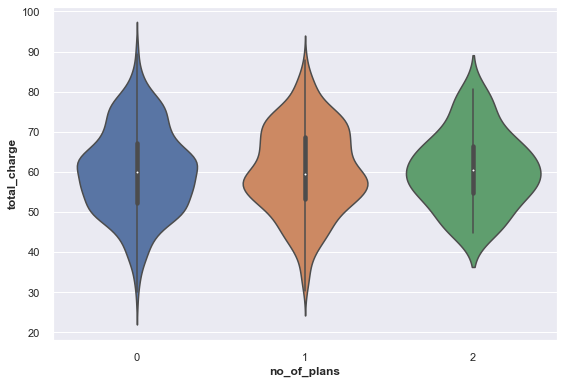

In [106]:
ax = sns.violinplot(x="no_of_plans", y="total_charge", data=df_train)

In [107]:
no_plan_customers = df_train[df_train['no_of_plans']==0]

In [108]:
no_plan_customers['total_charge'].mean()

60.09032765991167

In [109]:
_1_plan_customers = df_train[df_train['no_of_plans']==1]
_1_plan_customers['total_charge'].mean()


60.32410597580654

In [110]:
_2_plan_customers = df_train[df_train['no_of_plans']==2]
_2_plan_customers['total_charge'].mean()

60.4870588235294

In [111]:
_1_plan_customers = df_train[df_train['no_of_plans']==1]
_1_plan_customers['total_charge'].mean()

60.32410597580654

In [112]:
Index([        'account_length',         'intertiol_plan',
              'voice_mail_plan',     'number_vm_messages',
                'total_day_min',        'total_day_calls',
             'total_day_charge',          'total_eve_min',
              'total_eve_calls',       'total_eve_charge',
          'total_night_minutes',      'total_night_calls',
           'total_night_charge',     'total_intl_minutes',
             'total_intl_calls',      'total_intl_charge',
       'customer_service_calls',                  'Churn',
                            445,                      452,
                            547,           'total_charge',
                  'total_calls',              'total_min',
                  'no_of_plans',          'avg_call_mins'],
      dtype='object')

NameError: name 'Index' is not defined

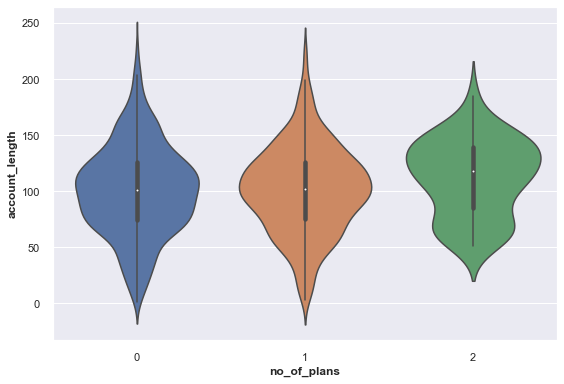

In [113]:
ax = sns.violinplot(x="no_of_plans", y="account_length", data=df_train)

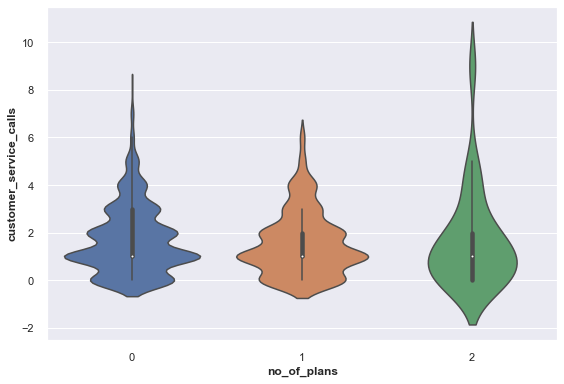

In [114]:
ax = sns.violinplot(x="no_of_plans", y="customer_service_calls", data=df_train)

In [115]:
features_x = [        'account_length',         'intertiol_plan',
              'voice_mail_plan',     'number_vm_messages',
                'total_day_min',        'total_day_calls',
             'total_day_charge',          'total_eve_min',
              'total_eve_calls',       'total_eve_charge',
          'total_night_minutes',      'total_night_calls',
           'total_night_charge',     'total_intl_minutes',
             'total_intl_calls',      'total_intl_charge',
       'customer_service_calls',                  'Churn',
                            445,                      452,
                            547,           'total_charge',
                  'total_calls',              'total_min',
                          'avg_call_mins']

<AxesSubplot:xlabel='voice_mail_plan', ylabel='number_vm_messages'>

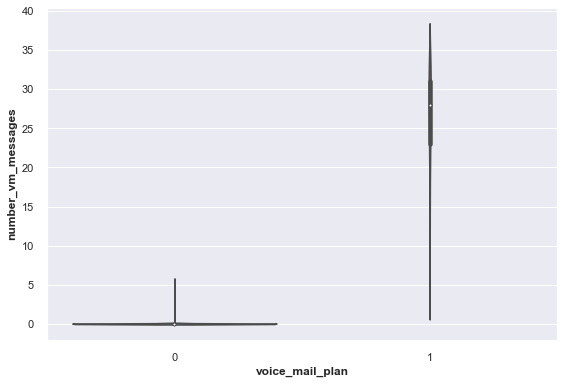

In [116]:

sns.violinplot(x="voice_mail_plan", y='number_vm_messages', data=df_train)

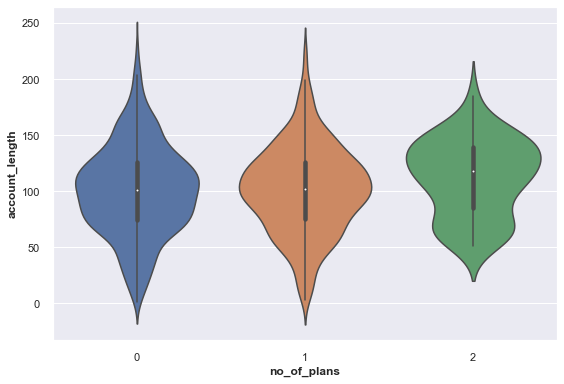

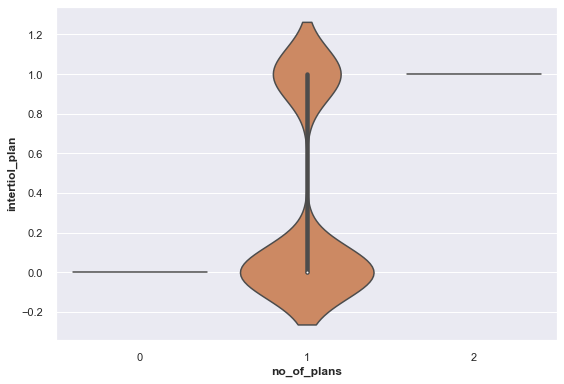

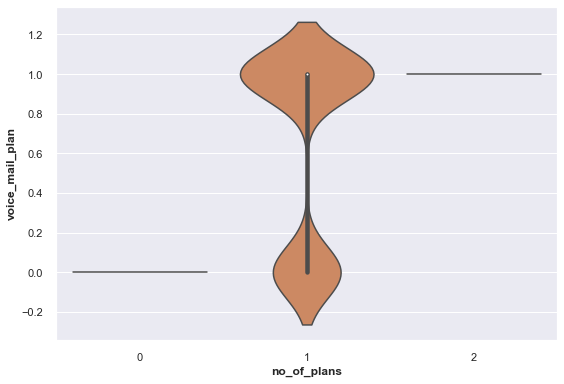

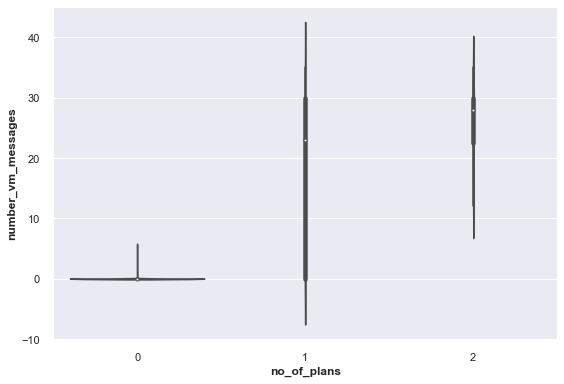

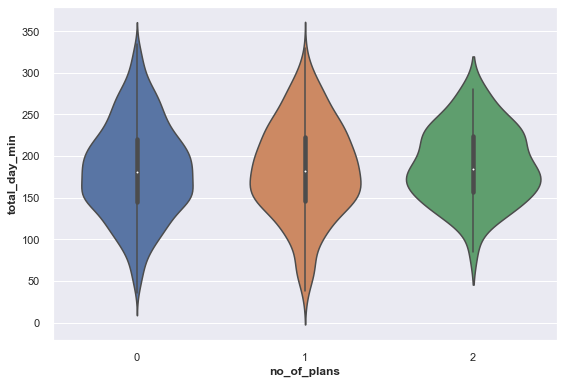

...

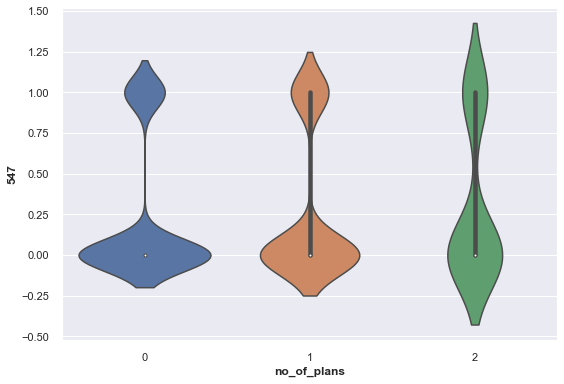

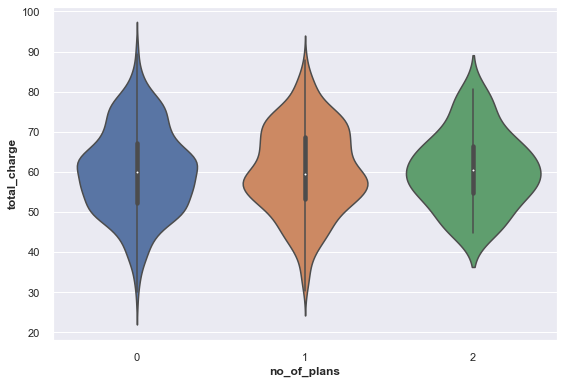

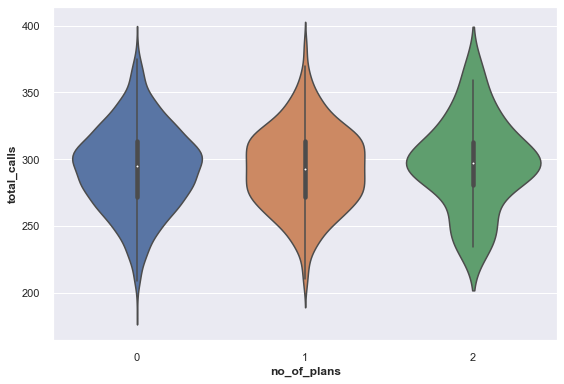

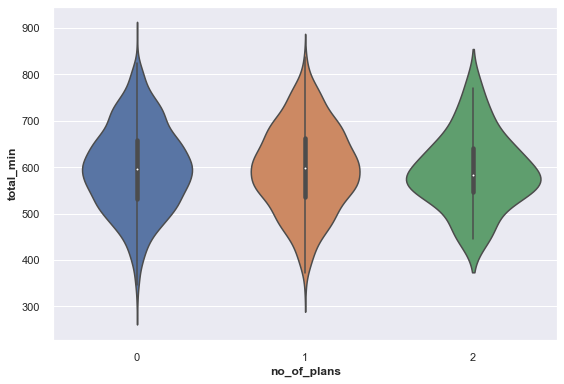

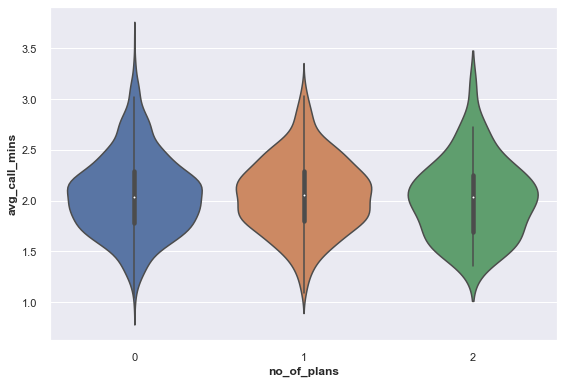

In [117]:
for i in features_x:
  sns.violinplot(x="no_of_plans", y=i, data=df_train)
  plt.show()

In [118]:
df_452 = df_train_cleaned[df_train_cleaned['location_code']==452]
data_452 = {
    'mean_call': [df_452['total_eve_calls'].mean(), df_452['total_intl_calls'].mean(), df_452['total_night_calls'].mean(),df_452['total_day_calls'].mean()],
    'mean_mins': [df_452['total_eve_min'].mean(), df_452['total_intl_minutes'].mean(), df_452['total_night_minutes'].mean(),df_452['total_day_min'].mean()]
    }

_452_mean_df = pd.DataFrame(data_452, index=['eve','intl','night','day'])
_452_mean_df

NameError: name 'df_train_cleaned' is not defined

In [119]:
calls_df_mean

,mean_call,mean_mins,mean_avg_mins_for_call
eve,100.272443,202.037815,2.014889
intl,4.410926,10.274716,2.329378
night,87.679981,201.243495,2.295205
day,100.872684,183.331799,1.817457


In [120]:
    'account_length',
    'voice_mail_plan',
    'customer_service_calls',
    445,
    547,
    452,
    'intertiol_plan',
    # 'number_vm_messages',
    'total_calls',
    'total_min',
    'total_intl_calls',
    'total_intl_charge',
    # 'total_intl_minutes',
    'total_night_calls',
    'total_eve_calls',
    'total_day_calls',
    'Churn'

'Churn'

In [121]:
df_452_ = df_train[df_train[452]==1]

In [122]:
df_452_.head()

,account_length,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,...,customer_service_calls,Churn,445,452,547,total_charge,total_calls,total_min,no_of_plans,avg_call_mins
0,15.0,0,0,0.0,121.1,130.0,20.59,216.0,86.0,18.36,...,2.0,0,0.0,1.0,0.0,53.88,254.0,588.3,0,2.316142
1,105.0,0,0,0.0,259.3,96.0,44.08,175.2,97.0,14.89,...,3.0,0,0.0,1.0,0.0,72.22,234.0,668.9,0,2.858547
2,97.0,0,1,32.0,183.4,94.0,31.18,269.1,120.0,22.87,...,5.0,0,0.0,1.0,0.0,65.02,256.0,662.7,1,2.588672
4,98.0,0,1,22.0,278.3,89.0,47.31,93.4,143.0,7.94,...,0.0,0,0.0,1.0,0.0,62.71,279.0,489.0,1,1.752688
10,85.0,0,0,0.0,176.4,122.0,29.99,224.9,123.0,19.12,...,1.0,0,0.0,1.0,0.0,62.10,296.0,632.4,0,2.136486


In [123]:
sns.scatterplot(data=df_452, x="account_length", y="voice_mail_plan", hue="Churn")

NameError: name 'df_452' is not defined

In [124]:
def compare_2(df,x,y):
    graph = sns.jointplot(data=df,x=x, y=y ,kind='reg')
    r, p = stats.pearsonr(df[x], df[y])
    # if you choose to write your own legend, then you should adjust the properties then
    phantom, = graph.ax_joint.plot([], [], linestyle="", alpha=0)
    # here graph is not a ax but a joint grid, so we access the axis through ax_joint method

    graph.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

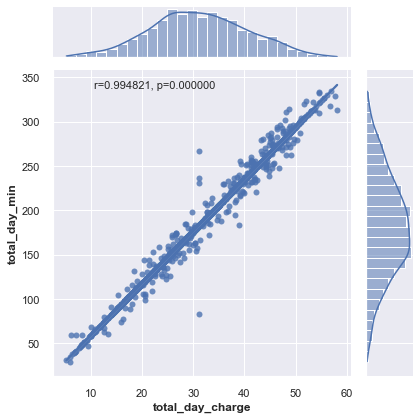

In [125]:
compare_2(df_train,x='total_day_charge',y='total_day_min')

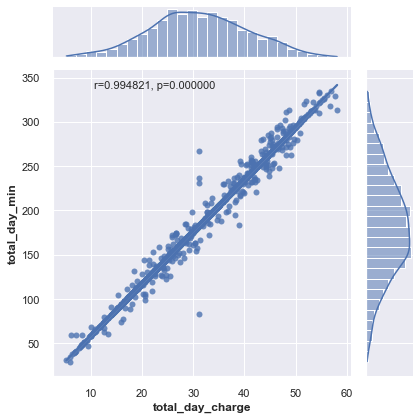

In [126]:
compare_2(df_train,x='total_day_charge',y='total_day_min')

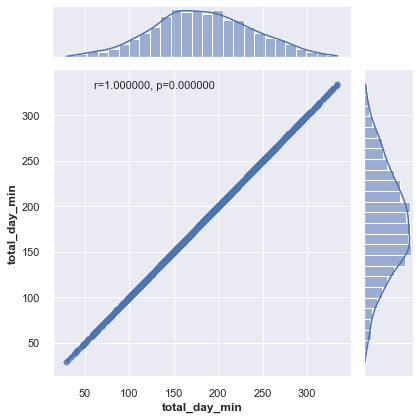

In [127]:
compare_2(df_train,x='total_day_min',y='total_day_min')

In [128]:
features_y=[        'account_length',         'intertiol_plan',
              'voice_mail_plan',     'number_vm_messages',
                'total_day_min',        'total_day_calls',
             'total_day_charge',          'total_eve_min',
              'total_eve_calls',       'total_eve_charge',
          'total_night_minutes',      'total_night_calls',
           'total_night_charge',     'total_intl_minutes',
             'total_intl_calls',      'total_intl_charge',
       'customer_service_calls',                  'Churn',
                            445,                      452,
                            547,           'total_charge',
                  'total_calls',              'total_min',
                  'no_of_plans',          'avg_call_mins']

In [129]:
from sklearn.cluster import KMeans

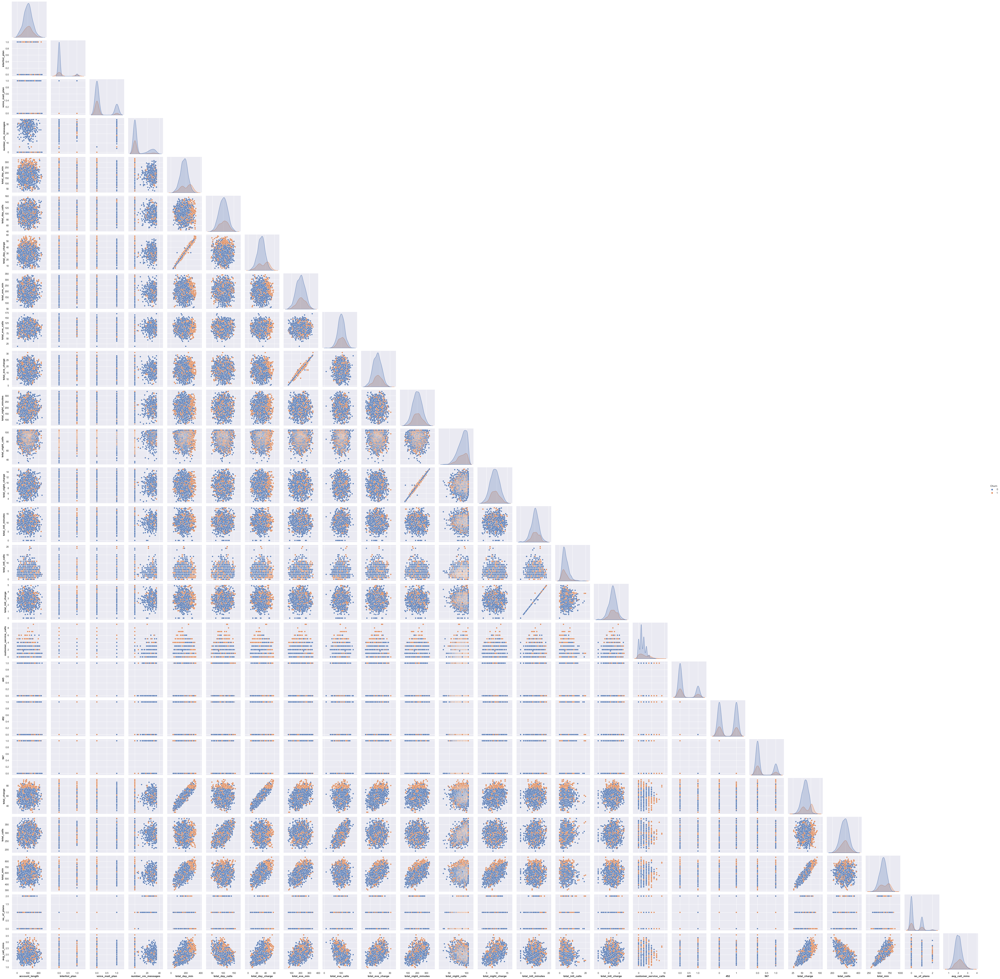

In [130]:
sns.pairplot(data=df_train,hue='Churn', corner=True)

<AxesSubplot:>

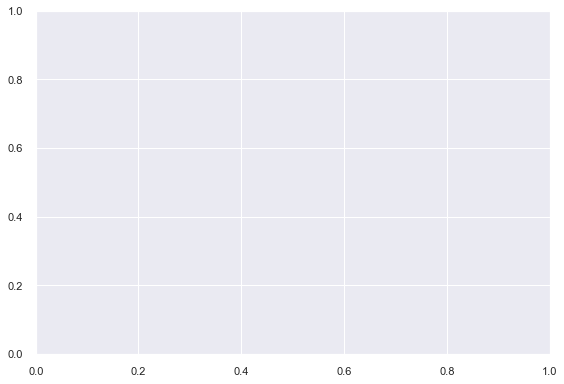

In [131]:
sns.histplot()

In [132]:

for i  in range(len()):
  for j in range(len()):
    

IndentationError: expected an indented block after 'for' statement on line 2 (1693298449.py, line 3)

In [133]:
selected_columns =[
    'account_length',
    'voice_mail_plan',
    'customer_service_calls',
    445,
    547,
    452,
    'intertiol_plan',
    # 'number_vm_messages',
    'total_calls',
    'total_min',
    'total_intl_calls',
    'total_intl_charge',
    # 'total_intl_minutes',
    'total_night_calls',
    'total_eve_calls',
    'total_day_calls',
    'Churn'
]

<AxesSubplot:>

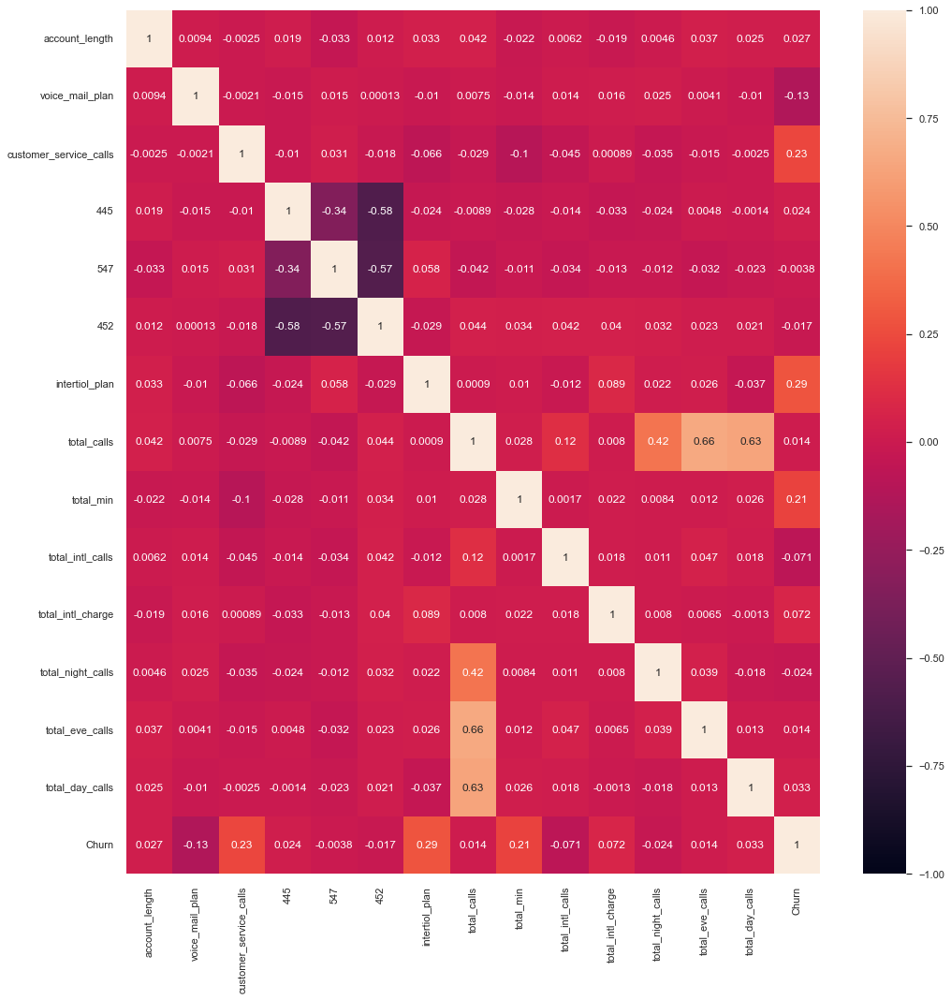

In [134]:
corr_train_sel = df_train[selected_columns].corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_train_sel, vmin=-1, vmax=1, annot=True)

In [135]:
# total

<AxesSubplot:>

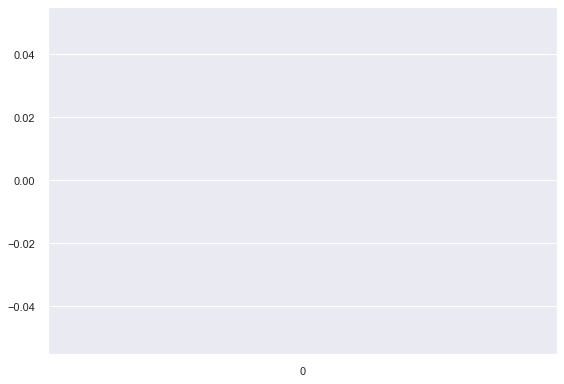

In [136]:
sns.barplot()

# Handle Imbalance of the dataset

In [ ]:
# showing the imbalanced class
sns.countplot(x = 'Churn', data = df_train)
plt.show()

In [ ]:
df_train_copy = df_train.copy()
df_test_copy = df_test.copy()

In [ ]:
selected_columns.remove('Churn')
selected_columns

In [ ]:
x=df_train_copy[selected_columns]
y=df_train_copy.Churn

In [ ]:
x.head()

In [ ]:
y.head()

#### use up sampling technique with SMOTE


##### split dataset

In [ ]:
x_train, x_test , y_train, y_test = train_test_split(x, y , test_size=0.3, random_state=42)

##### SMOTE

In [ ]:
print('Before upsampling count of label 0 {}'.format(sum(y_train==0)))
print('Before upsampling count of label 1 {}'.format(sum(y_train==1)))

print("SMOTE .....")
# Minority Over Sampling Technique
sm = SMOTE(sampling_strategy = 1, random_state=1)
x_train_s, y_train_s = sm.fit_resample(x_train, y_train.ravel())

print('After upsampling count of label 0 {}'.format(sum(y_train_s==0)))
print('After upsampling count of label 1 {}'.format(sum(y_train_s==1)))

#  Model Traning

In [ ]:
lr_model_1  = LogisticRegression(max_iter=2000,)
lr_model_1 .fit(x_train,y_train )
lr_model_1 .score(x_train, y_train)

In [ ]:
svc = SVC(kernel='rbf', decision_function_shape='ovr')
svc.fit(x_train, y_train)
y_pred = svc.predict(x_test)
print('Accuracy: ')
print('{}'.format(accuracy_score(y_test, y_pred)))
print('Classification report: ')
print('{}'.format(classification_report(y_test, y_pred)))
print('Confusion Matrix')
print('{}'.format(confusion_matrix(y_test, y_pred)))
# print('Cohen kappa score: ')
# print('{}'.format(cohen_kappa_score(y_test, y_pred)))

In [ ]:
xg = GradientBoostingClassifier(learning_rate=0.01, n_estimators=400,max_depth=13)
xg.fit(x_train,y_train )
xg.score(x_train, y_train)

In [ ]:
predsxg = xg.predict(x_test)
accuracy_score(y_test, predsxg)

In [ ]:
clf = RandomForestClassifier()
clf.fit(x_train,y_train )
clf.score(x_train, y_train)

In [ ]:
model3 = XGBClassifier()
model3.fit(x_train, y_train)
preds = model3.predict(x_test)
accuracy_score(y_test, preds)

#### getting dataset

In [ ]:
dataset_train_complete_preprocessed = pd.concat([df_baseline_train['customer_id'], df_train], axis=1).reindex(df_train.index)
dataset_test_complete_preprocessed = pd.concat([df_baseline_test['customer_id'], df_test], axis=1).reindex(df_test.index)